

## Assignment
In this assignment and the assignments of the following checkpoints, you work with the fashion MNIST dataset which is another image dataset that comprised of 70000 greyscale 28x28 images. The dataset contains 10 classes as follows:

- T-shirt/top
- Trouser/pants
- Pullover shirt
- Dress
- Coat
- Sandal
- Shirt
- Sneaker
- Bag
- Ankle boot
You can load the dataset using the fetch_openml function of sklearn.datasets as follows:

mnist = fetch_openml('Fashion-MNIST', version=1, cache=True)
Or alternatively, you can download it from this link and load it in your way.

Select 10000 images randomly and work on this sample in the following exercises. To complete this assignment, submit a link to a Jupyter notebook containing your solutions to the following tasks below, and plan on discussing with your mentor. You can also take a look at these example solutions.

1. Load the dataset and make your preprocessing like normalizing the data. 


2. Apply PCA to the data and get the first two principal components.


3. Using the first two principal components, draw a graph of the data by coloring and labeling the data points as we did in the checkpoint.


4. Do you think PCA solution is satisfactory? Can you distinguish between different classes easily?


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA

In [2]:
import sklearn
sklearn.__version__

'0.21.3'

In [6]:
# We load the MNIST dataset below
mnist = fetch_openml('Fashion-MNIST', version=1, cache=True)

In [11]:
np.random.seed(123)

indices = np.random.choice(70000,10000)
X = mnist.data[indices] / 255.0
y = mnist.target[indices]

print(X.shape, y.shape)

(10000, 784) (10000,)


In [21]:
y

array(['4', '7', '3', ..., '5', '9', '1'], dtype=object)

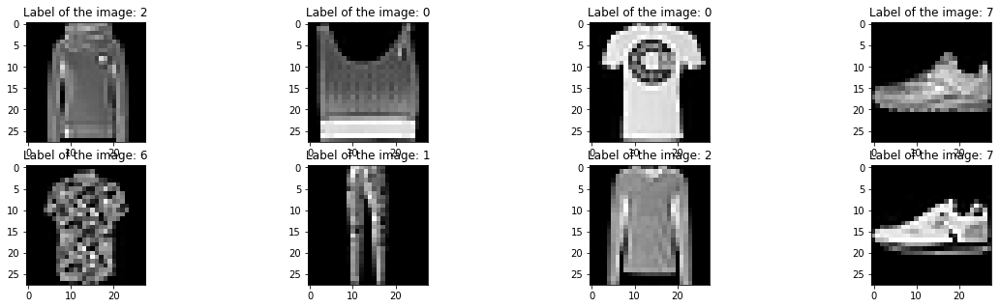

In [22]:
plt.figure(figsize=(20,5))

plt.subplot(241)
plt.imshow(X[123].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[123]))

plt.subplot(242)
plt.imshow(X[124].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[124]))

plt.subplot(243)
plt.imshow(X[125].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[125]))

plt.subplot(244)
plt.imshow(X[126].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[126]))

plt.subplot(245)
plt.imshow(X[127].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[127]))

plt.subplot(246)
plt.imshow(X[128].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[128]))

plt.subplot(247)
plt.imshow(X[129].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[129]))

plt.subplot(248)
plt.imshow(X[130].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[130]))

plt.show()

- T-shirt/top 0
- Trouser/pants 1
- Pullover shirt 2
- Dress 3
- Coat 4
- Sandal 5
- Shirt 6
- Sneaker 7
- Bag 8
- Ankle boot 9

In [13]:
# We just want the first two principal components
pca = PCA(n_components=2)

# We get the components by 
# calling fit_transform method with our data
pca_components = pca.fit_transform(X)

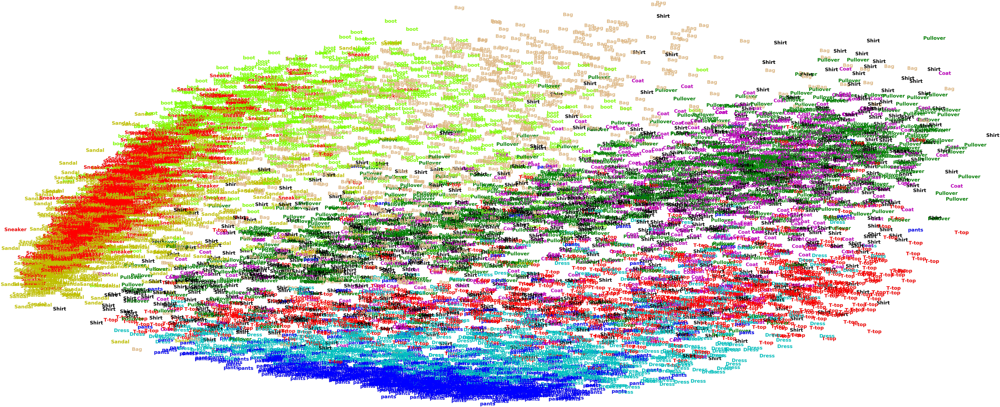

<function print>

In [36]:

labels = ['T-top','pants','Pullover','Dress','Coat',
         'Sandal','Shirt','Sneaker','Bag','boot']

#labels[i]

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1],labels[int(y[i])],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()
print

it appears that the clusters are relativly distinguishable with similar items clustering near one another for example sneakers boots and sandles are all at the center left of the chart while pants and dresses are near the bottom center shirts tops coats are at the center/right and bags are near the top

In [42]:
from sklearn.mixture import GaussianMixture

pcaX = PCA(n_components=4).fit_transform(X)


# Defining the agglomerative clustering
gmm_cluster = GaussianMixture(n_components=10, random_state=123)

# Fit model
mixtures = gmm_cluster.fit_predict(pcaX)



In [43]:
import pandas as pd
pd.crosstab(y,mixtures)

col_0,0,1,2,3,4,5,6,7,8,9
row_0,,,,,,,,,,
0,23,0,342,1,0,93,8,1,508,3
1,8,0,38,0,0,15,852,0,92,1
2,472,0,29,14,0,374,0,0,44,38
3,3,0,141,0,0,30,470,0,405,0
4,488,0,37,10,0,190,3,0,221,18
5,0,220,0,164,92,6,0,426,0,46
6,270,0,170,24,0,346,3,0,161,52
7,0,270,0,0,6,0,0,773,0,11
8,10,13,3,15,5,186,2,5,6,739
